<a href="https://colab.research.google.com/github/sarvvnaz/ComputerVision/blob/main/cv_hw1_solution.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Computer Vision Homework 1
Sarvenaz Salehi
810101462

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Part1
imptorting necessary libraries

In [7]:

import cv2
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML, display
import io
import base64

# Configure inline plotting
%matplotlib inline

sample_img = 'Pic.jpg'

## 1. Load and Inspect Image

The shape of the image is `(height, width, channels)`, and the data type (e.g., `uint8`) indicates the range of pixel values.


In [8]:
bgr = cv2.imread(sample_img)
print(bgr.shape)
print(bgr.dtype)

(633, 800, 3)
uint8


based on the output, it has uint8 format, 3 channels(b,g,r) , height 633 and width 800 pixels

## 2. Color Space Conversion

Images can be represented in different color spaces depending on the task. Here we convert the BGR image to RGB (for correct display), grayscale (brightness only), and binary (black and white) using thresholding. Binary images are useful for segmentation and OCR.


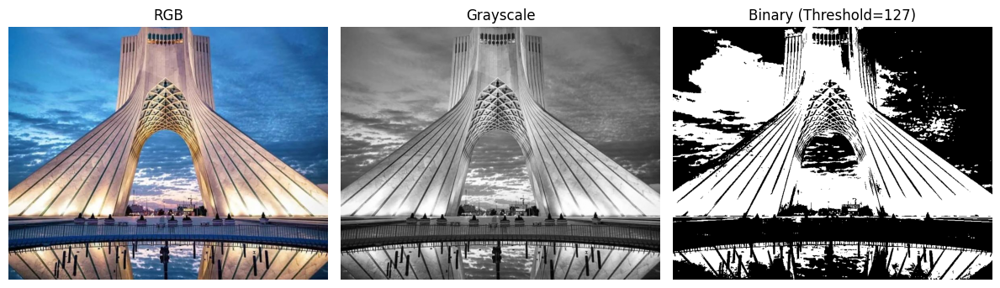

In [9]:
rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

gray = cv2.cvtColor(bgr, cv2.COLOR_BGR2GRAY)

threshold_value = 127
_, binary = cv2.threshold(gray, threshold_value, 255, cv2.THRESH_BINARY)

fig, axs = plt.subplots(1, 3, figsize=(12, 4))
axs[0].imshow(rgb)
axs[0].set_title('RGB')
axs[0].axis('off')

axs[1].imshow(gray, cmap='gray')
axs[1].set_title('Grayscale')
axs[1].axis('off')

axs[2].imshow(binary, cmap='gray')
axs[2].set_title('Binary (Threshold=127)')
axs[2].axis('off')

plt.tight_layout()


## 3. HSV Color Space

The HSV (Hue, Saturation, Value) color space separates color information from brightness.

Splitting channels allows us to analyze individual components.

*   Hue encodes the actual color (0–179 in OpenCV)

*   saturation describes color purity

*   value captures brightness.







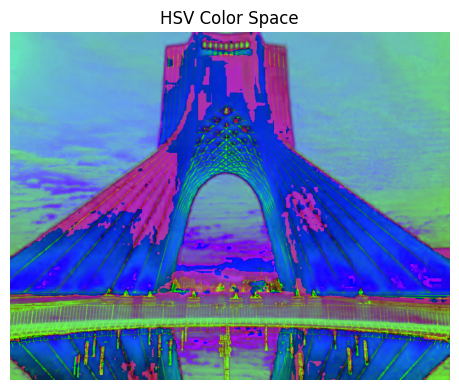

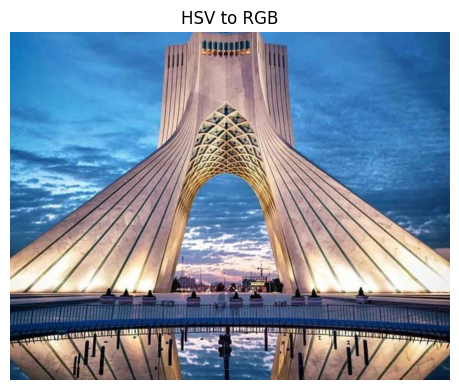

In [10]:
hsv = cv2.cvtColor(bgr, cv2.COLOR_BGR2HSV)
plt.figure(figsize=(6, 4))
plt.imshow(hsv)
plt.title('HSV Color Space')
plt.axis('off')
plt.tight_layout()

# HSV to RGB for display
cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
plt.figure(figsize=(6, 4))
plt.imshow(cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB))
plt.title('HSV to RGB')
plt.axis('off')
plt.tight_layout()


## 4.  Channel Splitting




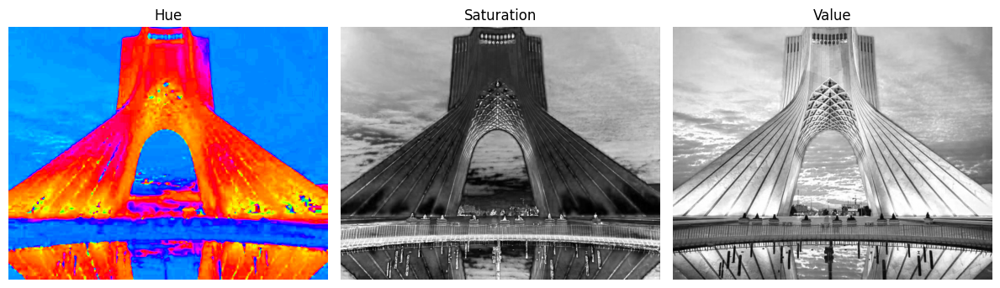

In [11]:
# Split HSV channels

h, s, v = cv2.split(hsv)

fig, axs = plt.subplots(1, 3, figsize=(12, 4))
axs[0].imshow(h, cmap='hsv')
axs[0].set_title('Hue')
axs[0].axis('off')

axs[1].imshow(s, cmap='gray')
axs[1].set_title('Saturation')
axs[1].axis('off')

axs[2].imshow(v, cmap='gray')
axs[2].set_title('Value')
axs[2].axis('off')

plt.tight_layout()


splitting original RGB image

(np.float64(-0.5), np.float64(799.5), np.float64(632.5), np.float64(-0.5))

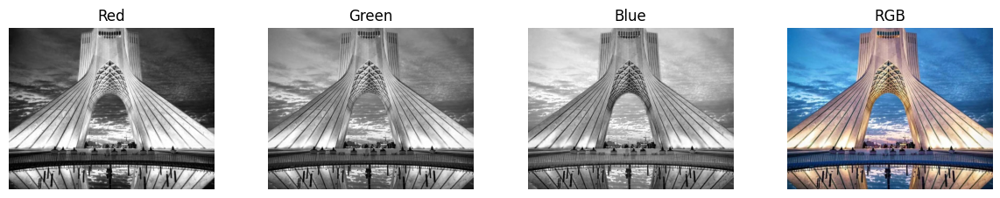

In [12]:
r, g, b = cv2.split(rgb)
fig, axs = plt.subplots(1,4, figsize  = (12,6))
plt.tight_layout()
axs[0].imshow(r, cmap='gray')
axs[0].set_title('Red')
axs[0].axis('off')

axs[1].imshow(g, cmap='gray')
axs[1].set_title('Green')
axs[1].axis('off')

axs[2].imshow(b, cmap='gray')
axs[2].set_title('Blue')
axs[2].axis('off')

axs[3].imshow(rgb)
axs[3].set_title('RGB')
axs[3].axis('off')

##5 Contrast

Contrast reflects the difference between the darkest and brightest parts of an image. A simple measure of contrast is `I_max - I_min`.

However, Contrast was measured using the standard deviation of grayscale pixel intensities. A higher standard deviation indicates greater variation between dark and bright regions, corresponding to higher image contrast.

We can increase or decrease contrast by scaling pixel intensities. `alpha > 1` increases contrast, while `alpha < 1` decreases it.

In image processing, contrast is often controlled using a linear transformation applied to each pixel intensity value:
$$\text{Output Pixel} = \alpha \cdot (\text{Input Pixel}) + \beta$$

$\mathbf{\alpha}$ (Contrast/Gain): A scaling factor that controls the contrast.$\alpha > 1$: Increases contrast (steeper slope).$0 < \alpha < 1$: Decreases contrast (shallower slope).

$\mathbf{\beta}$ (Brightness/Bias): An offset value that adjusts the overall brightness.

Contrast (I_max - I_min): 255
Contrast (Standard Deviation): 54.84205130125853
contrast of high-contrast image = 73.27
contrast of low-contrast image = 31.57


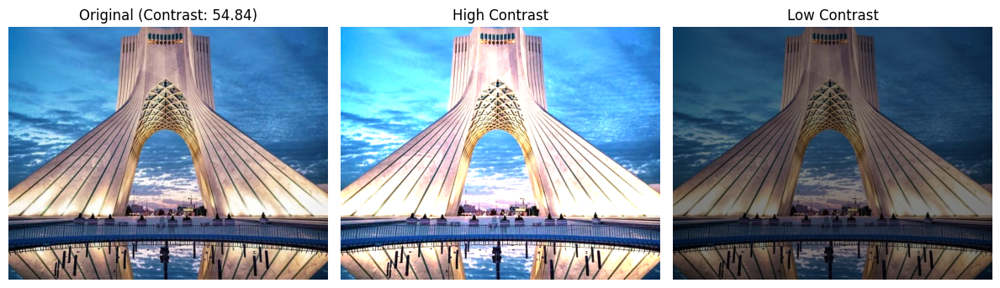

In [13]:
# contrast for the grayscale image
contrast = int(gray.max() - gray.min())
print("Contrast (I_max - I_min):", contrast)

# contrast using standard deviatiom of the gray scale
contrast_std = np.std(gray)
print("Contrast (Standard Deviation):", contrast_std)

# Increase contrast
high_contrast = cv2.convertScaleAbs(bgr, alpha=1.5, beta=0)

# Decrease contrast
low_contrast = cv2.convertScaleAbs(bgr, alpha=0.5, beta=0)

# Display results
fig, axs = plt.subplots(1, 3, figsize=(12, 4))
axs[0].imshow(cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB))
axs[0].set_title(f'Original (Contrast: {contrast_std:.2f})')
axs[0].axis('off')

axs[1].imshow(cv2.cvtColor(high_contrast, cv2.COLOR_BGR2RGB))
axs[1].set_title('High Contrast')
axs[1].axis('off')

axs[2].imshow(cv2.cvtColor(low_contrast, cv2.COLOR_BGR2RGB))
axs[2].set_title('Low Contrast')
axs[2].axis('off')

plt.tight_layout()
print(f'contrast of high-contrast image = {np.std(high_contrast):.2f}')
print(f'contrast of low-contrast image = {np.std(low_contrast):.2f}')

## 5. Histogram and Equalization

A histogram counts the number of pixels at each intensity level.

Histogram equalization redistributes pixel intensities to improve contrast, while histogram stretching linearly maps the existing intensity range to the full 0–255 range.

Both methods help enhance details in low-contrast images.

 A histogram helps quickly identify if an image is overexposed (too bright, many peaks on the right side) or underexposed (too dark, many peaks on the left side).


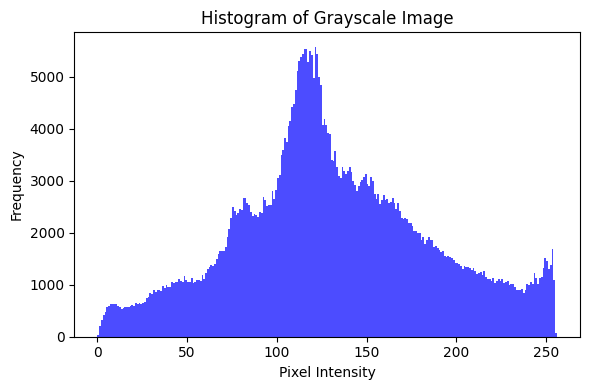

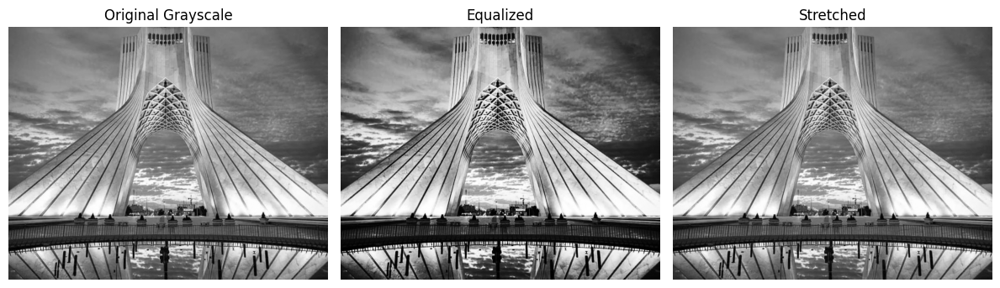

In [14]:
# Plot histogram of the grayscale image
plt.figure(figsize=(6, 4))
plt.hist(gray.ravel(), bins=256, range=[0, 256], color='blue', alpha=0.7)
plt.title('Histogram of Grayscale Image')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.tight_layout()

# Histogram equalization
equalized = cv2.equalizeHist(gray)

# Histogram stretching
min_val = int(gray.min())
max_val = int(gray.max())
stretched = ((gray.astype(np.float32) - min_val) / (max_val - min_val) * 255).astype(np.uint8)

fig, axs = plt.subplots(1, 3, figsize=(12, 4))
axs[0].imshow(gray, cmap='gray')
axs[0].set_title('Original Grayscale')
axs[0].axis('off')

axs[1].imshow(equalized, cmap='gray')
axs[1].set_title('Equalized')
axs[1].axis('off')

axs[2].imshow(stretched, cmap='gray')
axs[2].set_title('Stretched')
axs[2].axis('off')

plt.tight_layout()


histogram for the original RGB

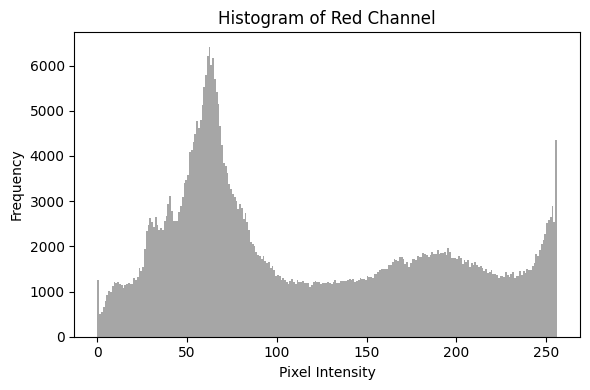

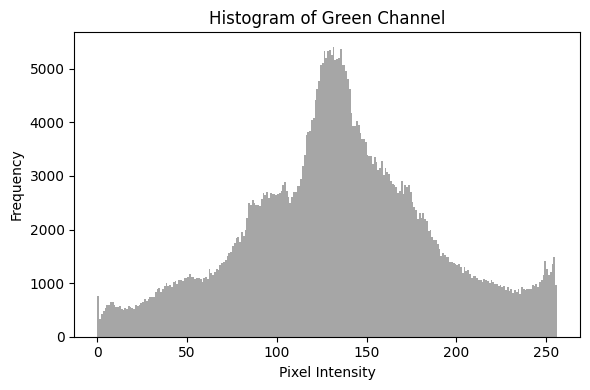

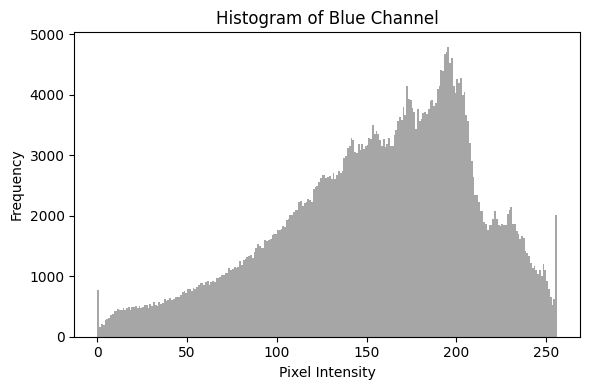

In [15]:
channels = ['Red', 'Green', 'Blue']
for i, channel in enumerate(channels):
    plt.figure(figsize=(6, 4))
    plt.hist(rgb[:, :, i].ravel(), bins=256, range=[0, 256], color='gray', alpha=0.7)
    plt.title(f'Histogram of {channel} Channel')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.tight_layout()

## Part 2

## 1,2. Noise Addition

Noise is random variation in pixel values.

Salt & pepper noise introduces random black and white pixels (impulse noise), while Gaussian noise adds random values drawn from a normal distribution.
the most  effective method for removing this noise is using a non-linear statistical filter. specially the Median filter, which replaces the noisy pixel's value with its neighbor's median value therefore removing the outliers.

Simulating noise helps us understand how filters perform under noisy conditions.


In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

file_name = 'Pic.jpg'
bgr = cv2.imread(file_name)
rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

Addimg salt and pepper noise.

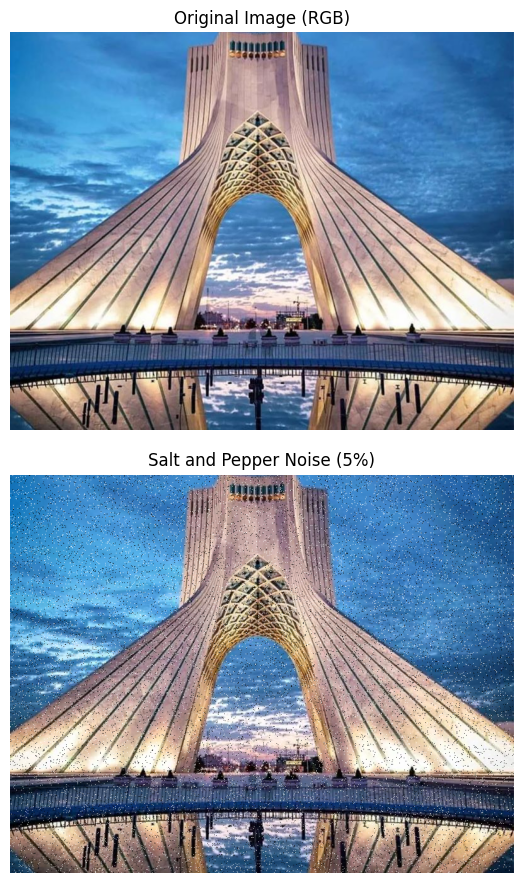

In [17]:
def add_salt_pepper(image, prob=0.05):

    noisy = image.copy()

    # Generate random matrix
    random = np.random.rand(*image.shape[:2])

    # Salt (white)
    noisy[random < prob/2] = 255

    # Pepper (black)
    noisy[random > 1 - prob/2] = 0

    return noisy

noise_prob = 0.05
I_noisy = add_salt_pepper(rgb, noise_prob)

fig, axes = plt.subplots(2, 1, figsize=(18, 9))
plt.tight_layout()

axes[0].imshow(rgb)
axes[0].set_title('Original Image (RGB)')
axes[0].axis('off')

axes[1].imshow(I_noisy)
axes[1].set_title(f'Salt and Pepper Noise ({noise_prob*100:.0f}%)')
axes[1].axis('off')

plt.show()

Gaussian Noise is a very common type of additive noise in image processing. It is characterized by its statistical properties, where the noise follows a Normal (Gaussian) distribution.

This noise is additive, meaning a random value is added to the original pixel intensity. These random values are sampled from a Gaussian distribution centered around a mean value (usually 0), with a certain standard deviation controlling the noise strength.

Gaussian noise typically appears because of:

* sensor thermal noise,
* electronic interference,
* low-light image acquisition,
* or camera hardware limitations.

Unlike Salt and Pepper noise, which creates isolated black and white pixels, Gaussian noise affects almost all pixels slightly, causing the image to appear grainy, blurry, or fuzzy.

Gaussian noise is commonly reduced using Low-pass Smoothing Filters such as:

* Gaussian Blur,
* Mean (Averaging) Filter,
* or Median Filter in some cases.

The Gaussian Blur filter is especially effective because it smooths neighboring pixel values using a Gaussian-weighted kernel, reducing random intensity variations while preserving overall image structure.


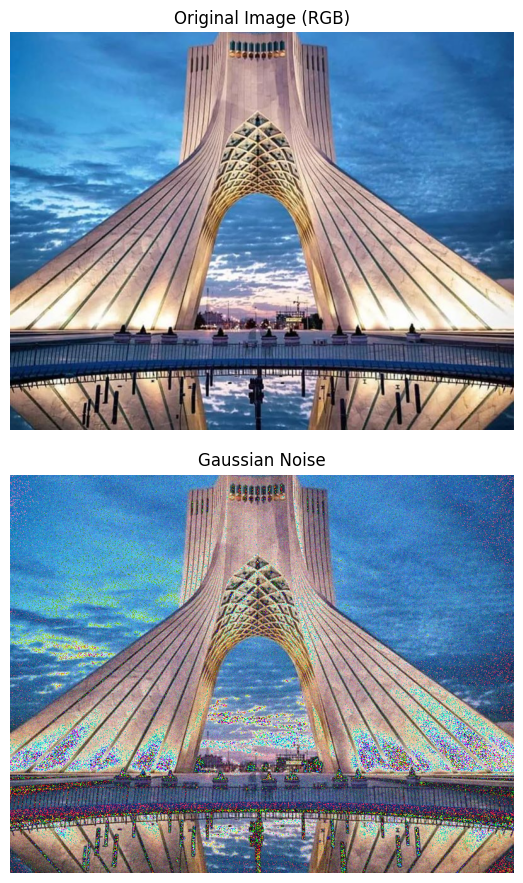

In [18]:
gaussian_noise = rgb.copy()
mean = 0
variance = 400
sigma = np.sqrt(variance)
gaussian_noise += np.random.normal(mean, sigma, gaussian_noise.shape).astype(np.uint8)
fig, axes = plt.subplots(2, 1, figsize=(18, 9))
plt.tight_layout()

axes[0].imshow(rgb)
axes[0].set_title('Original Image (RGB)')
axes[0].axis('off')

axes[1].imshow(gaussian_noise)
axes[1].set_title('Gaussian Noise')
axes[1].axis('off')

plt.show()

## 3. Kernels and Filtering


A Kernel (or Convolution Matrix) is a small matrix of numerical values used to apply image processing operations through the convolution process. It defines how a pixel and its neighboring pixels contribute to the new output value.

A kernel is usually a small 2D matrix such as:

```text id="0mqjlwm"
3×3
5×5
```

Each kernel is designed for a specific purpose, such as:

* blurring,
* sharpening,
* edge detection,
* or noise reduction.

The process of applying a kernel is called Convolution. During convolution, the kernel is placed over a region of the image centered on the current pixel. Each kernel value is multiplied by the corresponding pixel value beneath it, and all the results are summed together to produce the new output value for the central pixel. The kernel then slides across the entire image and repeats the same operation for every pixel.

Main Applications of Kernels:

* Blurring and Smoothing: using kernels with positive averaged weights to reduce noise and smooth the image.
* Sharpening: using kernels with strong positive center weights and negative surrounding weights to enhance image details.
* Edge Detection: using kernels such as Sobel or Laplacian to detect rapid intensity changes and object boundaries.
* Noise Reduction: smoothing noisy images before further processing.
* Feature Extraction: highlighting important image structures for computer vision tasks.


 High-pass filters emphasize edges and details (e.g., sharpening, edge detection). We implement a custom convolution function and apply it to noisy images.


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline


# 4 General Kernel Function

A kernel is a small matrix used as a filter. The function below applies a kernel to an image by sliding it over every pixel.

For each pixel:
1. A local neighborhood is selected.
2. The neighborhood is multiplied by the kernel.
3. The results are summed.
4. The final value becomes the new pixel value.

This function works with different odd kernel sizes such as `3x3`, `5x5`, and `7x7`.


In [35]:
def apply_kernel(image, kernel):
    """
    Apply a convolution kernel to a grayscale image.

    Parameters:
        image: 2D grayscale image
        kernel: 2D matrix with odd dimensions, e.g. 3x3 or 5x5

    Returns:
        filtered image
    """

    # Convert kernel to float for accurate multiplication
    kernel = np.array(kernel, dtype=np.float32)

    # Get kernel dimensions
    kernel_height, kernel_width = kernel.shape

    # Make sure kernel dimensions are odd
    if kernel_height % 2 == 0 or kernel_width % 2 == 0:
        raise ValueError("Kernel dimensions must be odd, such as 3x3, 5x5, etc.")

    # Padding size for height and width
    pad_h = kernel_height // 2
    pad_w = kernel_width // 2

    # Pad the image so borders can also be processed
    padded_image = np.pad(
        image,
        ((pad_h, pad_h), (pad_w, pad_w)),
        mode="constant",
        constant_values=0
    )

    # Create empty output image
    output = np.zeros_like(image, dtype=np.float32)

    # Slide kernel over image
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i + kernel_height, j:j + kernel_width]
            value = np.sum(region * kernel)
            output[i, j] = value

    # Clip values to valid image range
    output = np.clip(output, 0, 255)

    return output.astype(np.uint8)


#  5  Noise, Mean Filter, and Median Filter

Salt & Pepper noise randomly changes some pixels to black (`0`) and white (`255`).

The **Mean Filter** is a convolutional low-pass filter. It replaces each pixel with the average of its neighbors.

The **Median Filter** is a selective/non-linear filter. It replaces each pixel with the median value of its neighborhood. It is usually better for Salt & Pepper noise because it removes extreme black and white pixels without blurring edges too much.


    Add Salt & Pepper noise to a grayscale image.
    probability controls how much noise is added.

In [36]:
def add_salt_and_pepper_noise(image, probability=0.05):
    noisy = image.copy()
    random_matrix = np.random.rand(*image.shape)

    # Salt noise: white pixels
    noisy[random_matrix < probability / 2] = 255

    # Pepper noise: black pixels
    noisy[random_matrix > 1 - probability / 2] = 0

    return noisy


def apply_median_filter(image, kernel_size=3):

    if kernel_size % 2 == 0:
        raise ValueError("Kernel size must be odd, such as 3, 5, or 7.")

    pad = kernel_size // 2

    padded_image = np.pad(
        image,
        ((pad, pad), (pad, pad)),
        mode="constant",
        constant_values=0
    )

    output = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i + kernel_size, j:j + kernel_size]
            output[i, j] = np.median(region)

    return output.astype(np.uint8)


Add Salt & Pepper noise to the grayscale image and apply mean using  the general kernel function and  median filter using selective filtering


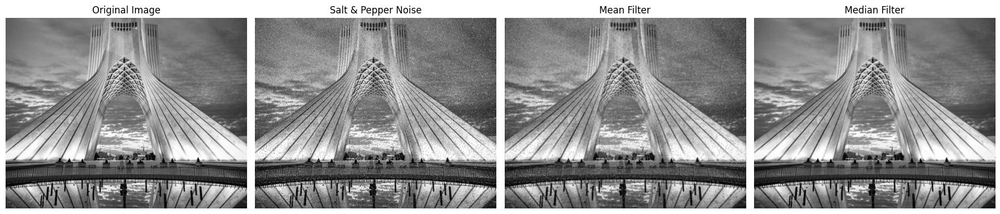

In [38]:

noise_probability = 0.05
# Use the 'gray' variable available from previous cells.
noisy_image_gray = add_salt_and_pepper_noise(gray, noise_probability)

mean_kernel = np.ones((3, 3), dtype=np.float32) / 9
mean_filtered = apply_kernel(noisy_image_gray, mean_kernel)

median_filtered = apply_median_filter(noisy_image_gray, kernel_size=3)

# Show results
fig, axes = plt.subplots(1, 4, figsize=(18, 5))

axes[0].imshow(gray, cmap="gray") # Use the 'gray' variable
axes[0].set_title("Original Image")
axes[0].axis("off")

axes[1].imshow(noisy_image_gray, cmap="gray")
axes[1].set_title("Salt & Pepper Noise")
axes[1].axis("off")

axes[2].imshow(mean_filtered, cmap="gray")
axes[2].set_title("Mean Filter")
axes[2].axis("off")

axes[3].imshow(median_filtered, cmap="gray")
axes[3].set_title("Median Filter")
axes[3].axis("off")

plt.tight_layout()
plt.show()


The mean filter smooths the noisy image by averaging neighboring pixels. However, because Salt & Pepper noise contains extreme values (`0` and `255`), the average can still be affected by those noisy pixels.

The median filter is better for this type of noise because it selects the middle value from the neighborhood. This removes isolated black and white pixels more effectively while preserving edges better than the mean filter.


## 6 High-Pass Filters

High-pass filters emphasize rapid intensity changes in an image. They are commonly used for edge detection.

Here we apply two high-pass filters:

1. **Sobel Filter:** Detects edges using stronger weights in the center row/column.
2. **Prewitt Filter:** Similar to Sobel, but uses simpler equal weights.

Both filters use two kernels:
- one for horizontal changes (`Gx`)
- one for vertical changes (`Gy`)

The final edge image is calculated from both directions.


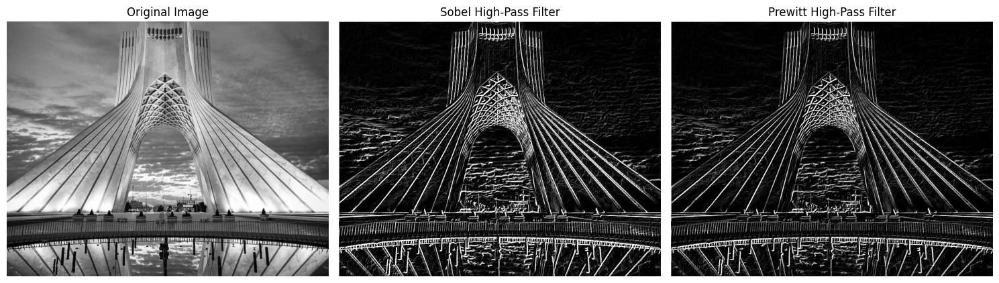

In [41]:
# Sobel kernels
sobel_x = np.array(
    [[-1, 0, 1],
     [-2, 0, 2],
     [-1, 0, 1]]
, dtype=np.float32)

sobel_y = np.array(
    [[-1, -2, -1],
     [ 0,  0,  0],
     [ 1,  2,  1]]
, dtype=np.float32)

# Prewitt kernels
prewitt_x = np.array(
    [[-1, 0, 1],
     [-1, 0, 1],
     [-1, 0, 1]]
, dtype=np.float32)

prewitt_y = np.array(
    [[-1, -1, -1],
     [ 0,  0,  0],
     [ 1,  1,  1]]
, dtype=np.float32)


def gradient_magnitude(gx, gy):
    """Combine x and y gradients into one edge image."""
    magnitude = np.sqrt(gx.astype(np.float32)**2 + gy.astype(np.float32)**2)
    magnitude = np.clip(magnitude, 0, 255)
    return magnitude.astype(np.uint8)


# Apply Sobel using our kernel function
# Change 'bgr' to 'gray' for 2D grayscale image processing
sobel_gx = apply_kernel(gray, sobel_x)
sobel_gy = apply_kernel(gray, sobel_y)
sobel_result = gradient_magnitude(sobel_gx, sobel_gy)

# Apply Prewitt using our kernel function
# Change 'bgr' to 'gray' for 2D grayscale image processing
prewitt_gx = apply_kernel(gray, prewitt_x)
prewitt_gy = apply_kernel(gray, prewitt_y)
prewitt_result = gradient_magnitude(prewitt_gx, prewitt_gy)

# Show results
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Change 'image' to 'gray' as 'image' is not defined and 'gray' is the original grayscale
axes[0].imshow(gray, cmap="gray")
axes[0].set_title("Original Image")
axes[0].axis("off")

axes[1].imshow(sobel_result, cmap="gray")
axes[1].set_title("Sobel High-Pass Filter")
axes[1].axis("off")

axes[2].imshow(prewitt_result, cmap="gray")
axes[2].set_title("Prewitt High-Pass Filter")
axes[2].axis("off")

plt.tight_layout()
plt.show()


The Sobel and Prewitt filters are high-pass filters because they highlight areas where pixel intensity changes quickly. These areas usually correspond to edges or object boundaries.

Sobel gives slightly stronger emphasis to the center pixels of the neighborhood, so it may produce stronger and smoother edge results. Prewitt is simpler and uses equal weights, so it is easier to understand but may be slightly less sensitive than Sobel.


## 7 Built-in OpenCV Filters and Comparison

In this part, we apply the same filters using OpenCV built-in functions and compare them with our manual implementations.

OpenCV functions are usually faster and more optimized because they are implemented internally in efficient C/C++ code.


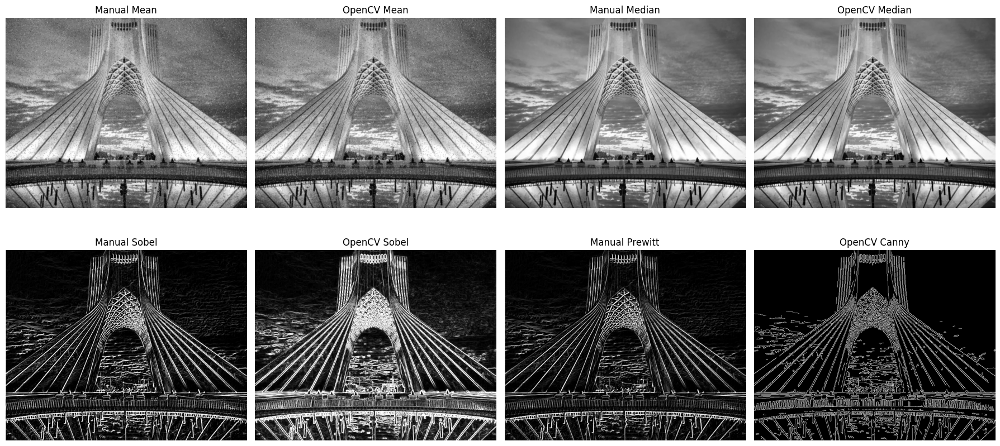

In [43]:
# Built-in OpenCV mean filter
opencv_mean = cv2.blur(noisy_image_gray, (3, 3))

# Built-in OpenCV median filter
opencv_median = cv2.medianBlur(noisy_image_gray, 3)

# Built-in OpenCV Sobel filter
opencv_sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
opencv_sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
opencv_sobel = np.sqrt(opencv_sobel_x**2 + opencv_sobel_y**2)
opencv_sobel = np.clip(opencv_sobel, 0, 255).astype(np.uint8)

# Built-in OpenCV Canny edge detector
opencv_canny = cv2.Canny(gray, 100, 200)

# Show comparison
fig, axes = plt.subplots(2, 4, figsize=(18, 9))

axes[0, 0].imshow(mean_filtered, cmap="gray")
axes[0, 0].set_title("Manual Mean")
axes[0, 0].axis("off")

axes[0, 1].imshow(opencv_mean, cmap="gray")
axes[0, 1].set_title("OpenCV Mean")
axes[0, 1].axis("off")

axes[0, 2].imshow(median_filtered, cmap="gray")
axes[0, 2].set_title("Manual Median")
axes[0, 2].axis("off")

axes[0, 3].imshow(opencv_median, cmap="gray")
axes[0, 3].set_title("OpenCV Median")
axes[0, 3].axis("off")

axes[1, 0].imshow(sobel_result, cmap="gray")
axes[1, 0].set_title("Manual Sobel")
axes[1, 0].axis("off")

axes[1, 1].imshow(opencv_sobel, cmap="gray")
axes[1, 1].set_title("OpenCV Sobel")
axes[1, 1].axis("off")

axes[1, 2].imshow(prewitt_result, cmap="gray")
axes[1, 2].set_title("Manual Prewitt")
axes[1, 2].axis("off")

axes[1, 3].imshow(opencv_canny, cmap="gray")
axes[1, 3].set_title("OpenCV Canny")
axes[1, 3].axis("off")

plt.tight_layout()
plt.show()

## 7 Comparison

The manually implemented filters and OpenCV built-in filters produce similar visual results for the same concepts. However, OpenCV functions are faster, more reliable, and handle border pixels better.

The manual implementation is useful for understanding how convolution and filtering work internally, while OpenCV functions are preferred in real applications because they are optimized and easier to use.


#Part 3. Video Processing

A video is a sequence of images (frames). Here we generate a synthetic video of a moving square, add salt & pepper noise to each frame, and apply a median filter to reduce the noise. Only the first few frames are displayed. In practice, load your own video using `cv2.VideoCapture('your_video.mp4')`.


### Load and analyze video
calculate frame numbers and fps

cv2.VideoCapture() is used to open the video file. If the video is opened successfully, frames can be read one by one from it.

FPS means frames per second. It shows how many frames are displayed in one second.
frame_count shows the total number of frames in the video.

### Add salt and pepper noise
This function adds Salt & Pepper noise to a video frame. Some random pixels are changed to white, called salt, and some random pixels are changed to black, called pepper.

### Create Output Videos
cv2.VideoWriter() is used to create new video files.
Here, one output video is created for the noisy video and another one for the filtered video.

Process the Video Frame by Frame


The video is processed inside a loop. In each iteration:

One frame is read from the original video.
Salt & Pepper noise is added to the frame.
Median filter is applied to remove the noise.
The noisy and filtered frames are written into output videos.

The Median filter is suitable for Salt & Pepper noise because it removes isolated black and white pixels while preserving edges better than an averaging filter.\




In [61]:
import cv2
import numpy as np
import os

input_path = "Original_Vid.mp4"

cap = cv2.VideoCapture(input_path)

if not cap.isOpened():
    raise Exception(f"Could not open input video: {input_path}")

fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

print("FPS:", fps)
print("Width:", width)
print("Height:", height)
print("Frame count:", frame_count)

fourcc = cv2.VideoWriter_fourcc(*"MJPG")

noisy_path = os.path.abspath("Vid_Noisy.avi")
filtered_path = os.path.abspath("Vid_Filtered.avi")

noisy_writer = cv2.VideoWriter(noisy_path, fourcc, fps, (width, height))
filtered_writer = cv2.VideoWriter(filtered_path, fourcc, fps, (width, height))

if not noisy_writer.isOpened():
    raise Exception("Noisy video writer failed.")

if not filtered_writer.isOpened():
    raise Exception("Filtered video writer failed.")


def add_salt_and_pepper_noise_color(frame, probability=0.02):
    noisy = frame.copy()
    random_matrix = np.random.rand(frame.shape[0], frame.shape[1])

    noisy[random_matrix < probability / 2] = [255, 255, 255]
    noisy[random_matrix > 1 - probability / 2] = [0, 0, 0]

    return noisy


processed_frames = 0

while True:
    ret, frame = cap.read()

    if not ret:
        break

    noisy_frame = add_salt_and_pepper_noise_color(frame, probability=0.02)
    filtered_frame = cv2.medianBlur(noisy_frame, 3)

    noisy_writer.write(noisy_frame)
    filtered_writer.write(filtered_frame)

    processed_frames += 1

cap.release()
noisy_writer.release()
filtered_writer.release()

print("Processed frames:", processed_frames)
print("Noisy size:", os.path.getsize(noisy_path) if os.path.exists(noisy_path) else 0)
print("Filtered size:", os.path.getsize(filtered_path) if os.path.exists(filtered_path) else 0)

FPS: 29.97
Width: 640
Height: 480
Frame count: 309
Processed frames: 309
Noisy size: 29061968
Filtered size: 3067570


## Conclusion

This notebook introduced the core concepts of basic image and video processing: loading images, converting between color spaces, adjusting contrast, computing histograms, adding and filtering noise, implementing convolution kernels, and processing simple video frames. These techniques form the foundation for more advanced computer vision methods and neural network architectures.
